## EDA

In [2]:
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from ydata_profiling import ProfileReport ## use for quick EDA report --- IGNORE ---
%matplotlib inline

In [3]:
df_crime = pd.read_csv("Major_Crime_Indicators.csv")
df_crime.head(20)

,OBJECTID,EVENT_UNIQUE_ID,REPORT_DATE,OCC_DATE,REPORT_YEAR,REPORT_MONTH,REPORT_DAY,REPORT_DOY,REPORT_DOW,REPORT_HOUR,...,OFFENCE,MCI_CATEGORY,HOOD_158,NEIGHBOURHOOD_158,HOOD_140,NEIGHBOURHOOD_140,LONG_WGS84,LAT_WGS84,x,y
0,1,GO-20141261013,1/1/2014 5:00:00 AM,1/1/2014 5:00:00 AM,2014,January,1,1,Wednesday,4,...,Assault,Assault,155,Downsview (155),026,Downsview-Roding-CFB (26),-79.483869,43.734369,-8.848104e+06,5.424427e+06
1,2,GO-20141261561,1/1/2014 5:00:00 AM,1/1/2014 5:00:00 AM,2014,January,1,1,Wednesday,8,...,Assault With Weapon,Assault,154,Oakdale-Beverley Heights (154),026,Downsview-Roding-CFB (26),-79.513772,43.719813,-8.851433e+06,5.422185e+06
2,3,GO-20141262377,1/1/2014 5:00:00 AM,1/1/2014 5:00:00 AM,2014,January,1,1,Wednesday,12,...,Assault Bodily Harm,Assault,068,North Riverdale (68),068,North Riverdale (68),-79.357562,43.674791,-8.834043e+06,5.415253e+06
3,4,GO-20141262553,1/1/2014 5:00:00 AM,1/1/2014 5:00:00 AM,2014,January,1,1,Wednesday,14,...,Assault,Assault,094,Wychwood (94),094,Wychwood (94),-79.422371,43.673842,-8.841258e+06,5.415106e+06
4,5,GO-20141263115,1/1/2014 5:00:00 AM,1/1/2014 5:00:00 AM,2014,January,1,1,Wednesday,16,...,Assault,Assault,120,Clairlea-Birchmount (120),120,Clairlea-Birchmount (120),-79.286725,43.700100,-8.826158e+06,5.419149e+06
5,6,GO-20141263744,1/1/2014 5:00:00 AM,1/1/2014 5:00:00 AM,2014,January,1,1,Wednesday,18,...,Assault With Weapon,Assault,061,Taylor-Massey (61),061,Taylor-Massey (61),-79.300618,43.694414,-8.827704e+06,5.418273e+06
6,7,GO-20141260912,1/1/2014 5:00:00 AM,1/1/2014 5:00:00 AM,2014,January,1,1,Wednesday,6,...,Robbery With Weapon,Robbery,078,Kensington-Chinatown (78),078,Kensington-Chinatown (78),-79.401983,43.647598,-8.838988e+06,5.411068e+06
7,8,GO-20141264272,1/1/2014 5:00:00 AM,1/1/2014 5:00:00 AM,2014,January,1,1,Wednesday,21,...,Assault With Weapon,Assault,085,South Parkdale (85),085,South Parkdale (85),-79.420532,43.638306,-8.841053e+06,5.409639e+06
8,9,GO-20141264140,1/1/2014 5:00:00 AM,1/1/2014 5:00:00 AM,2014,January,1,1,Wednesday,20,...,Assault,Assault,100,Yonge-Eglinton (100),100,Yonge-Eglinton (100),-79.400083,43.705466,-8.838777e+06,5.419975e+06
9,10,GO-20141264140,1/1/2014 5:00:00 AM,1/1/2014 5:00:00 AM,2014,January,1,1,Wednesday,20,...,Assault,Assault,100,Yonge-Eglinton (100),100,Yonge-Eglinton (100),-79.400083,43.705466,-8.838777e+06,5.419975e+06


In [4]:
df_crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 452949 entries, 0 to 452948
Data columns (total 31 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   OBJECTID           452949 non-null  int64  
 1   EVENT_UNIQUE_ID    452949 non-null  object 
 2   REPORT_DATE        452949 non-null  object 
 3   OCC_DATE           452949 non-null  object 
 4   REPORT_YEAR        452949 non-null  int64  
 5   REPORT_MONTH       452949 non-null  object 
 6   REPORT_DAY         452949 non-null  int64  
 7   REPORT_DOY         452949 non-null  int64  
 8   REPORT_DOW         452949 non-null  object 
 9   REPORT_HOUR        452949 non-null  int64  
 10  OCC_YEAR           452798 non-null  float64
 11  OCC_MONTH          452798 non-null  object 
 12  OCC_DAY            452798 non-null  float64
 13  OCC_DOY            452798 non-null  float64
 14  OCC_DOW            452798 non-null  object 
 15  OCC_HOUR           452949 non-null  int64  
 16  DI

In [5]:
df_crime.describe()

,OBJECTID,REPORT_YEAR,REPORT_DAY,REPORT_DOY,REPORT_HOUR,OCC_YEAR,OCC_DAY,OCC_DOY,OCC_HOUR,UCR_CODE,UCR_EXT,LONG_WGS84,LAT_WGS84,x,y
count,452949.000000,452949.000000,452949.000000,452949.000000,452949.000000,452798.000000,452798.000000,452798.00000,452949.000000,452949.000000,452949.000000,452949.000000,452949.000000,4.529490e+05,4.529490e+05
mean,226475.000000,2019.790588,15.755321,183.212693,12.711206,2019.722243,15.435190,182.61512,12.556760,1709.238210,146.908067,-78.227370,43.062103,-8.708231e+06,5.340230e+06
std,130755.257877,3.397504,8.779119,102.957332,6.456066,3.429958,8.949285,103.48370,7.283552,329.732642,52.275629,9.571369,5.268745,1.065480e+06,6.534068e+05
min,1.000000,2014.000000,1.000000,1.000000,0.000000,2000.000000,1.000000,1.00000,0.000000,1410.000000,100.000000,-79.639247,0.000000,-8.865400e+06,5.664924e-09
25%,113238.000000,2017.000000,8.000000,96.000000,8.000000,2017.000000,8.000000,95.00000,7.000000,1430.000000,100.000000,-79.475052,43.659420,-8.847122e+06,5.412887e+06
50%,226475.000000,2020.000000,16.000000,184.000000,13.000000,2020.000000,15.000000,183.00000,14.000000,1450.000000,100.000000,-79.394133,43.699427,-8.838114e+06,5.419045e+06
75%,339712.000000,2023.000000,23.000000,270.000000,18.000000,2023.000000,23.000000,270.00000,19.000000,2120.000000,200.000000,-79.321995,43.750852,-8.830084e+06,5.426966e+06
max,452949.000000,2025.000000,31.000000,366.000000,23.000000,2025.000000,31.000000,366.00000,23.000000,2135.000000,230.000000,0.000000,43.853164,6.327780e-09,5.442747e+06


In [6]:
profile = ProfileReport(df_crime, title="Profiling Report")

<Axes: title={'center': 'Division Wise Crime Count'}, xlabel='DIVISION'>

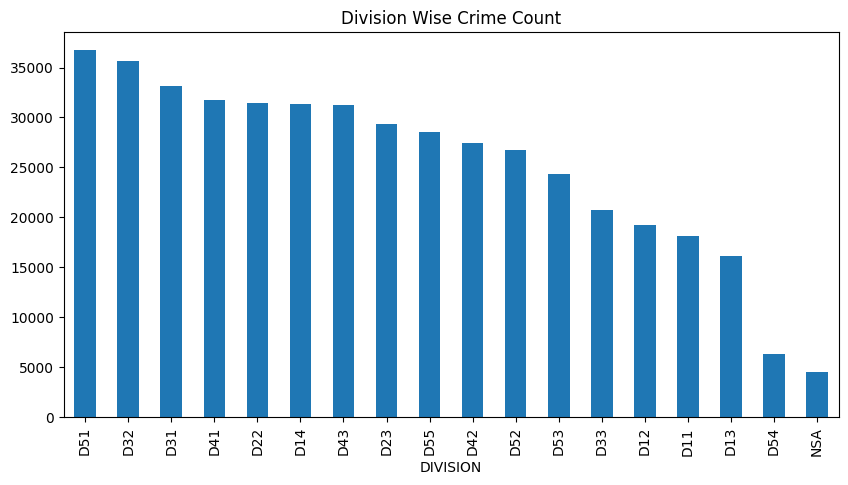

In [11]:
df_crime.DIVISION.value_counts().plot(kind='bar', title='Division Wise Crime Count', figsize=(10,5))

<Axes: title={'center': 'Reports by Month'}, xlabel='REPORT_MONTH'>

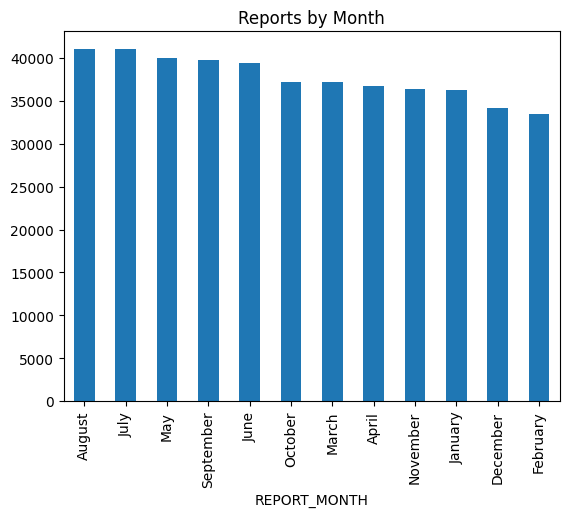

In [8]:
df_crime.REPORT_MONTH.value_counts().plot(kind='bar', title='Reports by Month')

In [9]:
profile 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

100%|██████████| 31/31 [00:06<00:00,  4.53it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]